In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

In [116]:
#Read file
file_path = 'C:\\Users\\kevin\\OneDrive\\Documents\\Work\\Python\\TechnicalExercise\\atmoshpericemissionsghg.xlsx'
df = pd.read_excel(file_path,sheet_name = 'GHG total ', index_col=0)

# DATA CLEANING

##### Get rid of any Unnamed columns, get rid of any 'NaN' values or rows, remove any unecessary information that does not contribute to the exercise at hand

##### This will be for GHG Total sheet

In [117]:
#If duplicates exist we can delete them
df.drop_duplicates()

#Delete the NaN row above total greenhouse emission
df = df.dropna(axis=0, how='all', subset=df.columns[1:-1])
df.fillna('', inplace=True)

#Delete the Unnamed column
df = df.drop('Unnamed: 1', axis=1, errors='ignore')
df = df.reset_index(drop=True)

# Format the data to 2 sig figs
pd.set_option('display.float_format', lambda x: '%.2f' % x)

df.rename(columns = {'Groups':'Industries'}, inplace = True)

# EXPLORATORY DATA ANALYSIS

##### Statistical analysis, visualisation and plots, line charts over time, and breakdown by industry will be performed here

In [118]:
# Get high level overview
df.describe()

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
count,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00,...,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00,22.00
mean,76631.32,77505.13,75765.19,74171.70,73175.36,72807.46,75199.43,73755.97,74174.60,71372.65,...,59652.98,58417.50,55542.45,54601.93,52625.21,51196.40,51285.86,50053.08,44417.85,45707.87
std,182142.60,184099.84,179640.12,175544.01,173217.11,172148.40,177746.34,174089.05,175089.35,168390.68,...,142258.14,139313.21,131968.98,129455.12,124583.87,121106.44,121386.88,118433.40,105028.65,108276.17
min,76.30,75.10,76.80,78.20,81.90,83.40,81.60,84.30,81.00,80.50,...,47.30,41.90,46.40,42.50,51.60,46.20,47.60,47.70,31.50,40.70
25%,1990.45,2105.97,1952.80,1986.12,1958.02,1976.62,2024.00,1855.58,1812.00,1790.03,...,1330.40,1307.12,1210.12,1249.28,1280.08,1248.88,1218.45,1210.35,1047.28,1143.45
50%,6272.25,6592.90,6836.85,6316.80,6489.35,6460.70,6860.15,6886.05,6707.65,6647.00,...,5898.80,5850.35,5229.60,5022.05,5078.70,4932.05,5032.85,4879.10,4488.80,5042.70
75%,63995.15,64291.38,65000.08,65827.95,66764.53,68909.55,73510.70,72480.68,73125.28,69560.98,...,45295.05,43781.82,44777.08,45165.10,44680.15,45492.78,45020.15,44528.72,43013.25,44167.85
max,842944.60,852556.50,833417.10,815888.80,804929.00,800882.10,827193.70,811315.70,815920.60,785099.20,...,656182.90,642592.40,610966.90,600621.20,578877.30,563160.30,564144.50,550583.80,488596.40,502786.60


In [119]:
#Calculate the mean of each industry to show which one contributes the most emission
df.groupby('Industries').mean().mean(axis=1).sort_values(ascending=False)

Industries
Total greenhouse gas emissions                                                                                              714306.35
Electricity, gas, steam and air conditioning supply                                                                         164517.24
Consumer expenditure                                                                                                        149804.44
Manufacturing                                                                                                               122937.78
Transport and storage                                                                                                        83519.42
Water supply; sewerage, waste management and remediation activities                                                          53116.19
Agriculture, forestry and fishing                                                                                            52204.87
Mining and quarrying                               

In [120]:
# Get table of industries with highest - lowest emission
df.sort_values(by=1990, ascending = False)

,Industries,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021
21,Total greenhouse gas emissions,842944.60,852556.50,833417.10,815888.80,804929.00,800882.10,827193.70,811315.70,815920.60,...,656182.90,642592.40,610966.90,600621.20,578877.30,563160.30,564144.50,550583.80,488596.40,502786.60
3,"Electricity, gas, steam and air conditioning s...",217638.60,214348.20,202484.40,185006.10,180725.00,178167.00,177971.40,164572.80,170829.80,...,178586.40,169386.40,148443.90,132014.90,110073.40,99866.90,95829.70,89371.30,80310.90,86080.90
2,Manufacturing,176067.90,177032.40,170118.30,165079.30,168003.90,166085.40,167363.60,166017.90,158150.00,...,89688.40,92323.80,91436.10,88752.10,84312.40,85314.20,84017.60,83794.90,80927.20,81593.90
20,Consumer expenditure,143893.70,152359.20,150676.40,155426.70,150210.30,144708.10,159770.40,153848.30,156346.70,...,146065.10,148147.50,136001.50,139976.40,142422.10,141389.90,144174.10,140918.00,125152.70,134761.90
4,"Water supply; sewerage, waste management and r...",75232.50,76756.70,76870.80,77189.40,77556.20,78634.30,79137.00,77930.10,78942.10,...,32164.50,29286.80,27392.90,27221.50,27117.40,28111.60,28407.50,27934.30,26552.40,26551.40
7,Transport and storage,66667.40,67119.00,68163.30,69528.80,70523.60,73415.50,79112.20,88152.60,93145.30,...,83237.30,80131.40,85013.20,86923.50,89634.30,83261.50,88024.50,86628.10,62349.60,56753.80
0,"Agriculture, forestry and fishing",55978.40,55808.50,55510.40,54725.40,55487.30,55391.70,56706.20,56132.40,55674.80,...,49671.90,48613.50,50571.80,51146.30,50534.40,51286.50,50557.70,50060.20,48500.20,50040.00
1,Mining and quarrying,50762.10,50877.20,51480.60,51092.00,44876.20,46739.80,46903.00,46035.60,44644.90,...,22281.00,20953.70,20887.30,22201.00,21100.30,21031.10,20790.90,20736.30,19135.70,17181.40
14,Public administration and defence; compulsory ...,12375.80,11673.30,11826.00,12017.50,11377.50,11385.50,11175.20,10690.60,10213.50,...,6370.40,5786.20,5169.50,4807.50,4713.40,4654.40,4721.90,4632.50,3868.30,4441.00
6,Wholesale and retail trade; repair of motor ve...,12127.00,12490.80,12324.70,12571.60,12970.10,13152.40,13486.10,13410.20,13778.10,...,17650.20,17277.70,17099.70,17229.40,17487.30,17015.40,16542.80,16086.80,14267.50,14945.00


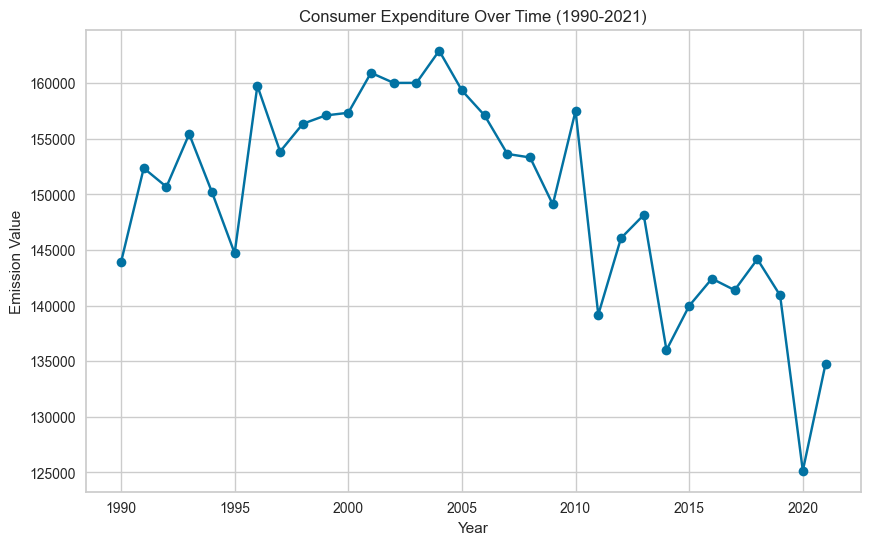

In [121]:
# Filter the data for 'Consumer expenditure'
consumer_expenditure_data = df[df['Industries'] == 'Consumer expenditure']

# Plot the data
plt.figure(figsize=(10, 6))
plt.plot(consumer_expenditure_data.columns[1:], consumer_expenditure_data.iloc[0, 1:], marker='o')
plt.title('Consumer Expenditure Over Time (1990-2021)')
plt.xlabel('Year')
plt.ylabel('Emission Value')
plt.grid(True)
plt.show()

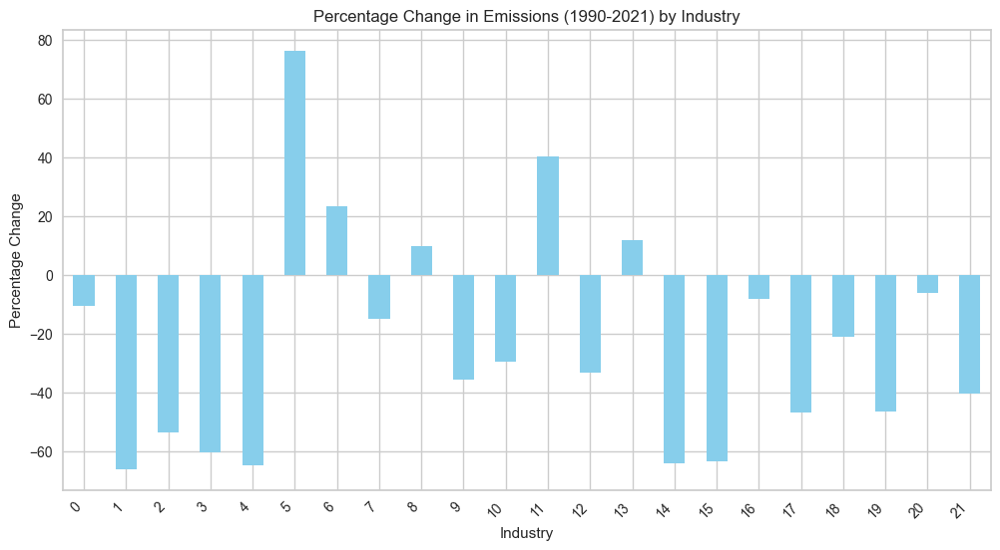

In [122]:
# Calculate percentage change for each industry
percentage_changes = ((df.iloc[:, -1] - df.iloc[:, 1]) / df.iloc[:, 1]) * 100

# Plot the percentage changes
plt.figure(figsize=(12, 6))
percentage_changes.plot(kind='bar', color='skyblue')
plt.title('Percentage Change in Emissions (1990-2021) by Industry')
plt.xlabel('Industry')
plt.ylabel('Percentage Change')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.show()

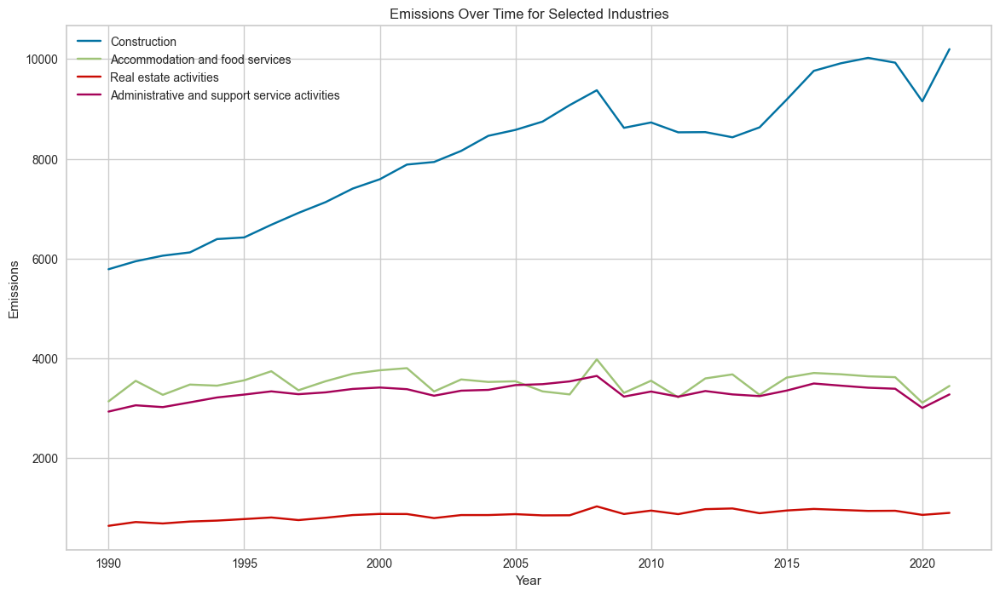

In [163]:
# List of industries to focus on
industries_of_interest = [
    'Construction',
    'Wholesale and retail trade; repair of motor vehicles',
    'Accommodation and food services',
    'Real estate activities',
    'Administrative and support service activities',
]

# Filter the DataFrame for the selected industries
selected_df = df[df['Industries'].isin(industries_of_interest)]

# Plot the emissions for the selected industries
plt.figure(figsize=(14, 8))
for industry in industries_of_interest:
    industry_data = selected_df[selected_df['Industries'] == industry].iloc[:, 1:]
    
    # Check if there is data for the selected industry
    if not industry_data.empty:
        plt.plot(df.columns[1:], industry_data.values.flatten(), label=industry)

plt.title('Emissions Over Time for Selected Industries')
plt.xlabel('Year')
plt.ylabel('Emissions')
plt.legend()
plt.show()

In [124]:
summary_stats = df.describe().transpose()

In [125]:
# Calculate percentage change 
start_year = 1990
end_year = 2021
start_emissions = summary_stats.loc[start_year, 'mean'] 
end_emissions = summary_stats.loc[end_year, 'mean']
    
pct_change = ((end_emissions - start_emissions) / start_emissions) * 100
print(f'Mean % Change from 1990 to 2021: {pct_change:.2f}%') 

Mean % Change from 1990 to 2021: -40.35%


In [126]:
# Calculate std-dev and check for variability
start_std = summary_stats.loc[start_year, 'std']
end_std = summary_stats.loc[end_year, 'std']

print(f'Std dev in 1990: {start_std:.2f}') 
print(f'Std dev in 2021: {end_std:.2f}')

if end_std > start_std:
    print('Variability has increased')
else:
    print('Variability has decreased')

Std dev in 1990: 182142.60
Std dev in 2021: 108276.17
Variability has decreased


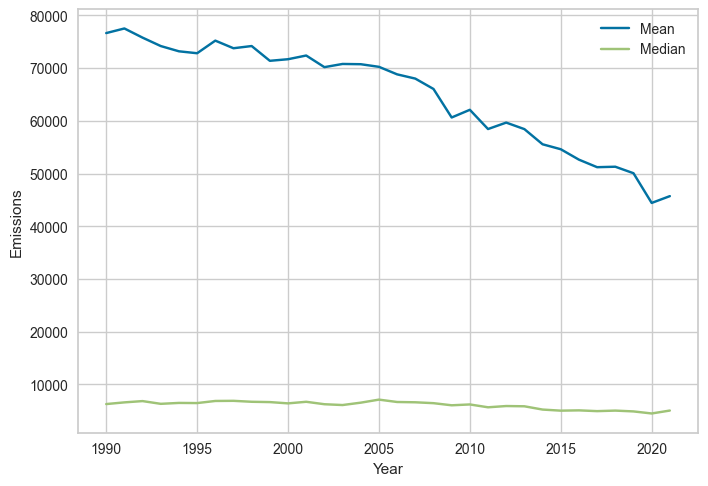

In [127]:
# Plot mean and median emissions over time
fig, ax = plt.subplots()
ax.plot(summary_stats['mean'], label='Mean')
ax.plot(summary_stats['50%'], label='Median')
ax.set_xlabel('Year')
ax.set_ylabel('Emissions')
ax.legend()
plt.show()

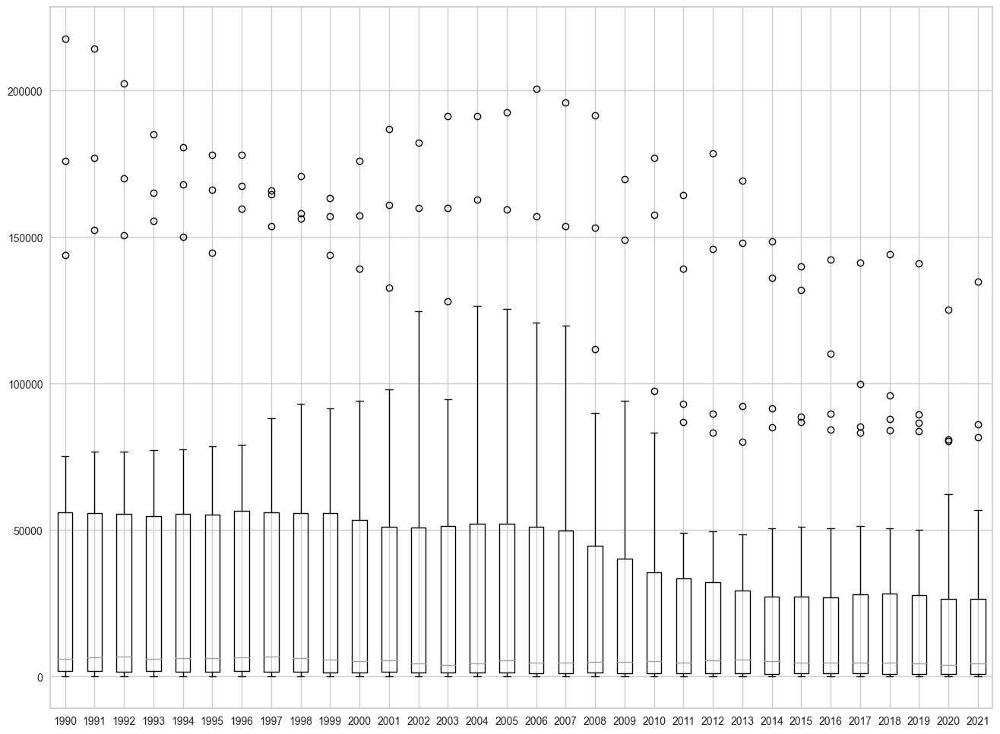

In [128]:
#Total greenhouse gas emissions will give a massive outlier skewing the boxplot, it is best to get rid of it by dropping the entire group column

#Create new dataframe and exclude the Industries column
df_boxplot = df[df['Industries'] != 'Total greenhouse gas emissions']

# Drop the 'Industries' column for the boxplot
df_boxplot = df_boxplot.drop('Industries', axis=1)

# Convert the columns to numeric values
df_boxplot = df_boxplot.apply(pd.to_numeric)

# Create the boxplot
df_boxplot.boxplot(figsize=(16, 12))
plt.show()

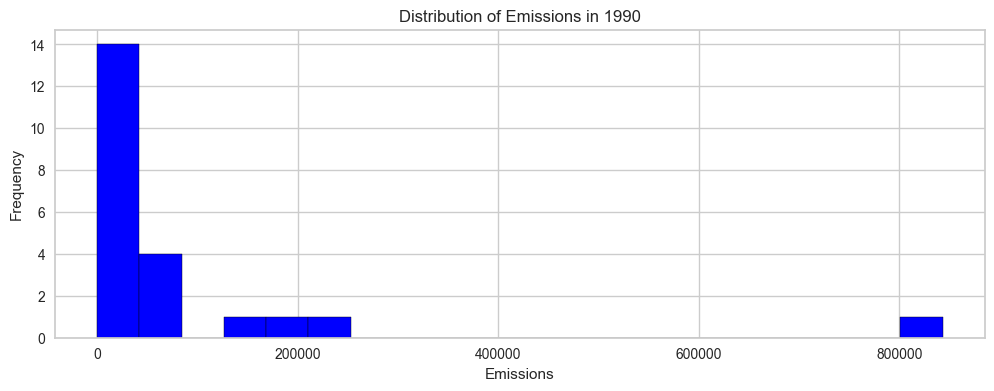

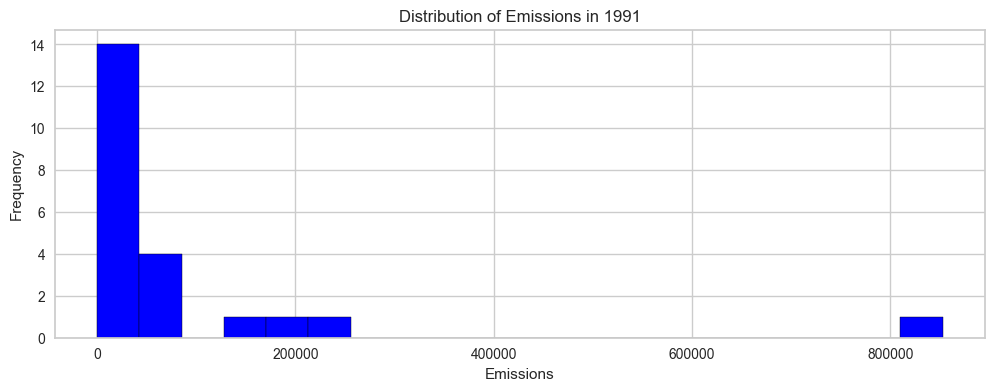

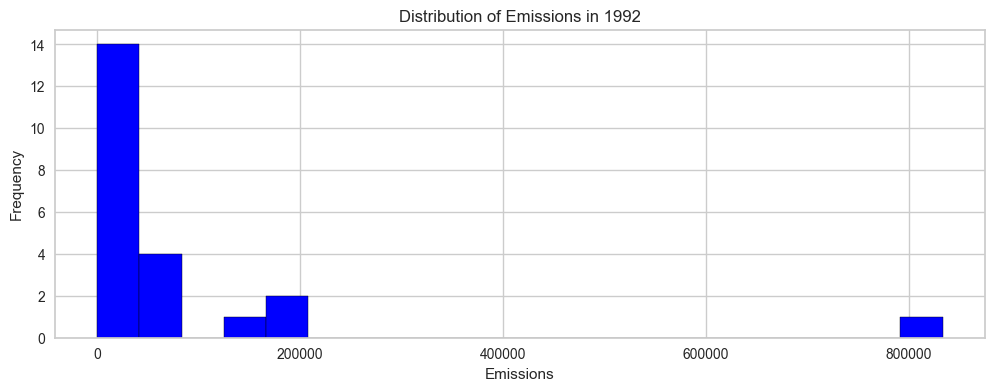

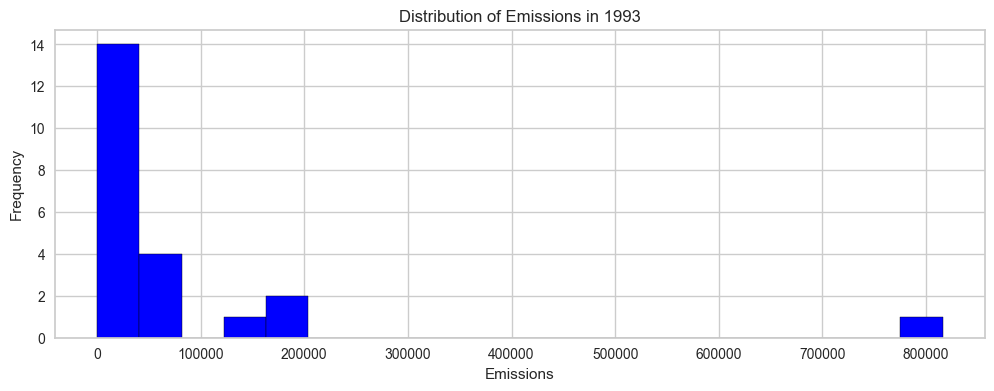

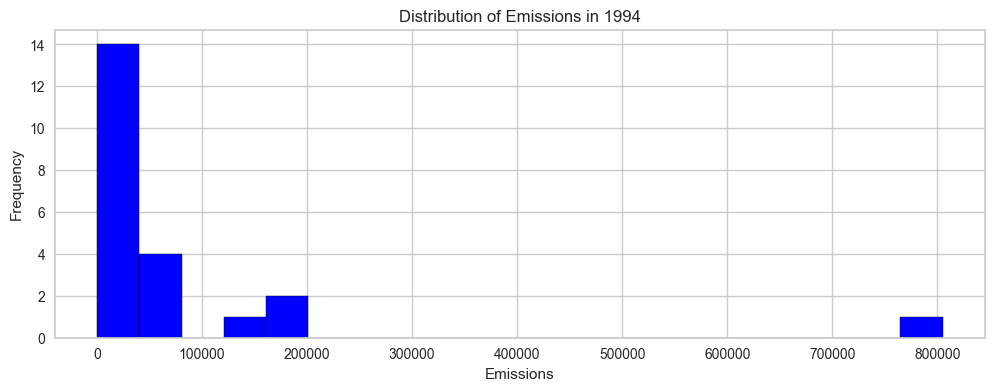

...

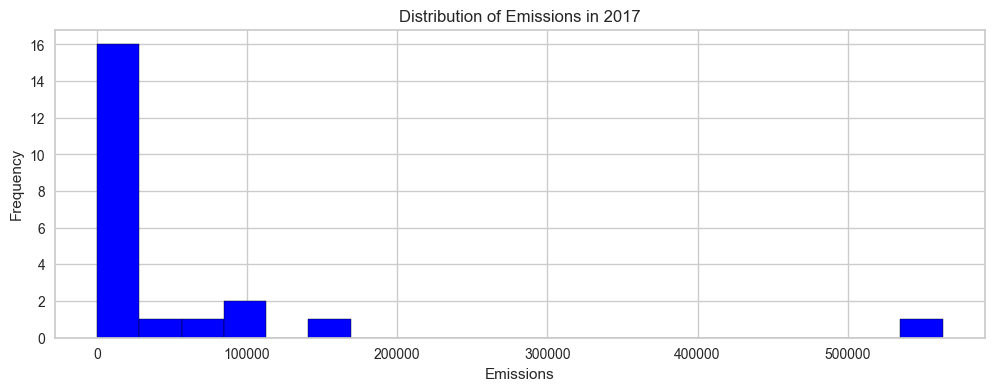

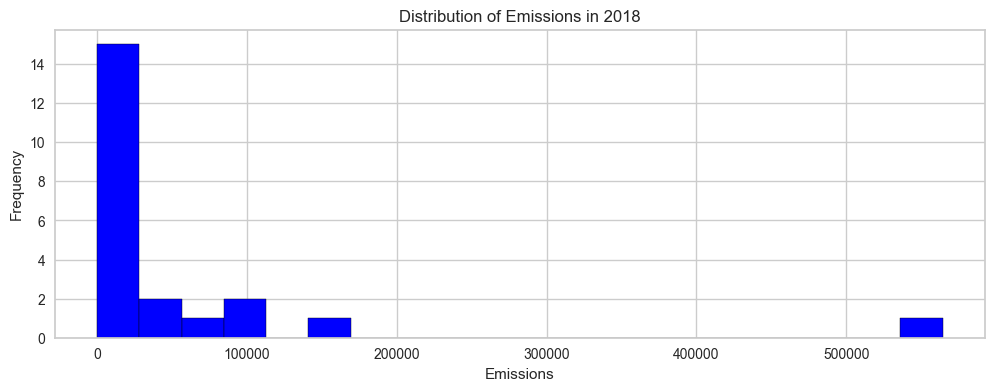

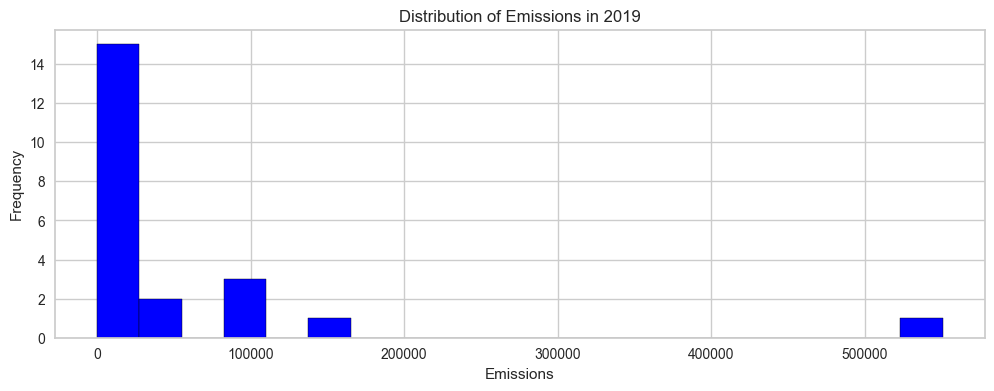

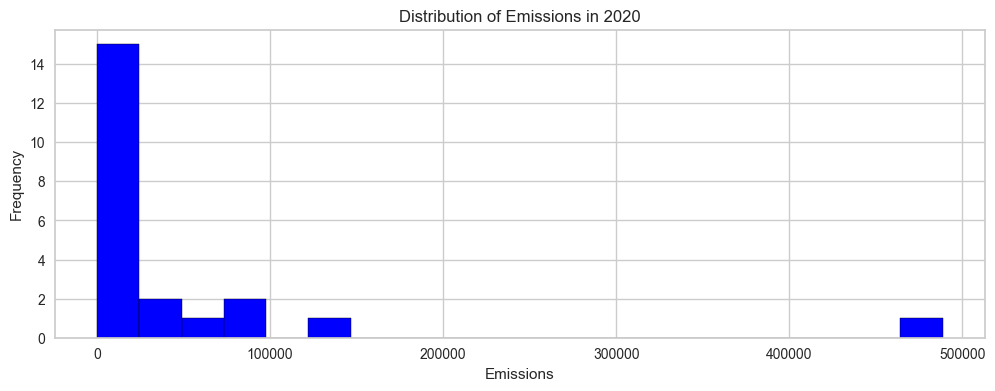

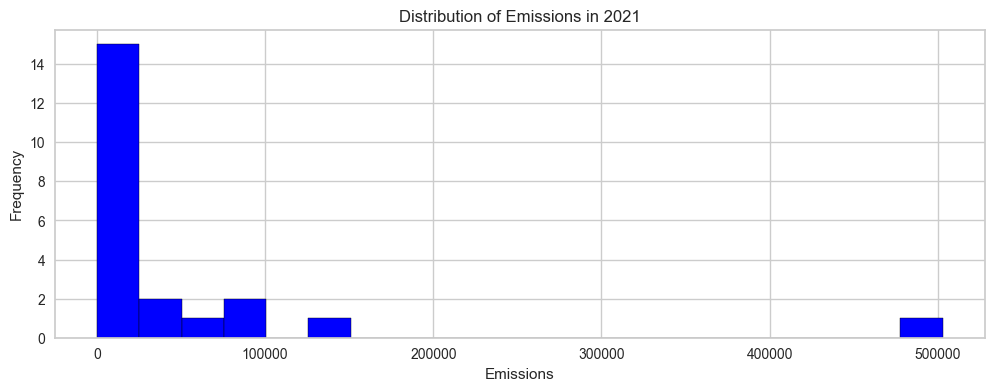

In [129]:
# Create hisogram for each year based on frequency of emission 
for year in df.columns[1:]:
    plt.figure(figsize=(12, 4))
    plt.hist(df[year], bins=20, color='blue', edgecolor='black')
    plt.title(f'Distribution of Emissions in {year}')
    plt.xlabel('Emissions')
    plt.ylabel('Frequency')
    plt.show()

# 2008-2009:
#Regulatory Changes
#Economic Downturn

# 2019:
# New policy introduced

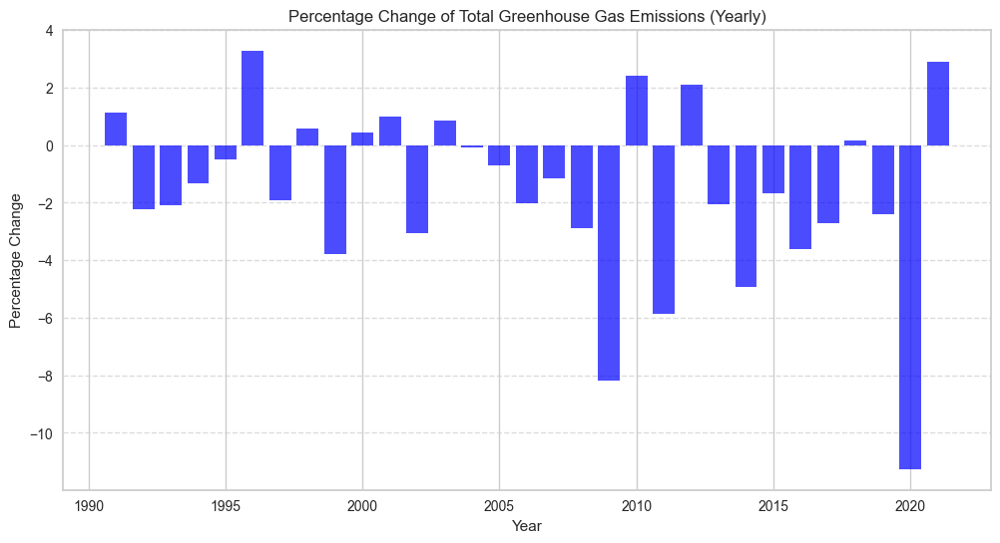

In [130]:
# Select total ghg row
total_emissions = df.loc[df['Industries'] == 'Total greenhouse gas emissions', df.columns[1:]].iloc[0]

# Calculate percentage change for total greenhouse gas emissions
percentage_change_total = total_emissions.pct_change() * 100

# Plotting
plt.figure(figsize=(12, 6))
plt.bar(percentage_change_total.index, percentage_change_total, color='blue', alpha=0.7)
plt.title('Percentage Change of Total Greenhouse Gas Emissions (Yearly)')
plt.xlabel('Year')
plt.ylabel('Percentage Change')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [131]:
# Select 'Total greenhouse gas emissions' row
total_emissions = df[df['Industries'] == 'Total greenhouse gas emissions'].iloc[:, 1:]

# Calculate percentage change for each year
percentage_change = total_emissions.pct_change(axis=1) * 100

# Display the results
print("Percentage Change of Total Greenhouse Gas Emissions:")
print(percentage_change)

Percentage Change of Total Greenhouse Gas Emissions:
    1990  1991  1992  1993  1994  1995  1996  1997  1998  1999  ...  2012  \
21   NaN  1.14 -2.24 -2.10 -1.34 -0.50  3.29 -1.92  0.57 -3.78  ...  2.09   

    2013  2014  2015  2016  2017  2018  2019   2020  2021  
21 -2.07 -4.92 -1.69 -3.62 -2.72  0.17 -2.40 -11.26  2.90  

[1 rows x 32 columns]


# Model selection

#### Here the format of the data is changed to fit the requirements of the exercise and forecast next 5 years
#### Plot on a graph to check trends/seasonality for extra clarity
#### Choose 2-3 models and run models on training/testing sets and calculate accuracy and pick best model
#### Forecast on only model is necessary
#### Plot output on graph for visualisation

### FORMAT DATA FOR MODELLING ###

In [132]:
# Filter rows where 'Industries' is 'Total greenhouse gas emissions'
total_emissions = df[df['Industries'] == 'Total greenhouse gas emissions']
# Drop the 'Industries' column 
total_emissions = total_emissions.drop('Industries', axis=1)
# DF to have years as rows and emissions as columns
ghg_total = total_emissions.transpose()
# Reset the index to make 'Year' a column
ghg_total = ghg_total.reset_index()
# Rename the columns
ghg_total.columns = ['Year', 'Total Greenhouse Gas Emissions']
ghg_total

,Year,Total Greenhouse Gas Emissions
0,1990,842944.60
1,1991,852556.50
2,1992,833417.10
3,1993,815888.80
4,1994,804929.00
5,1995,800882.10
6,1996,827193.70
7,1997,811315.70
8,1998,815920.60
9,1999,785099.20


<AxesSubplot: xlabel='Year'>

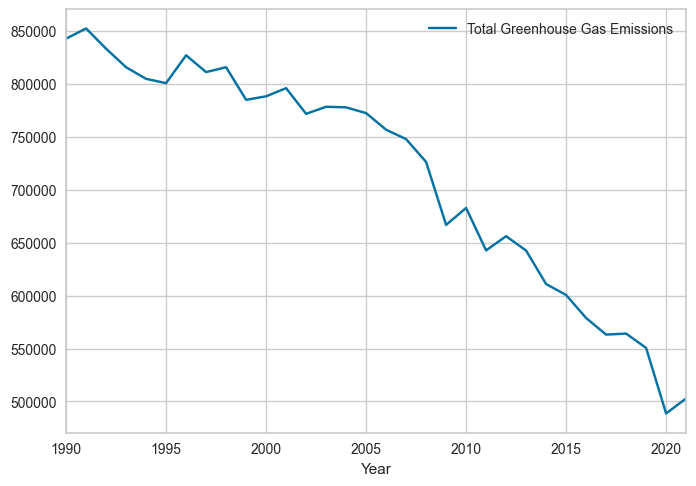

In [133]:
#Change 'Year' data type to a data time
ghg_total['Year'] = pd.to_datetime(ghg_total['Year'], format='%Y')
ghg_total.set_index('Year', inplace=True)
ghg_total.plot()

### THE PYCARET MODEL ###

In [134]:
from pycaret.regression import *
from pycaret.time_series import *

In [135]:
# Function to set up pycaret model for preprocessing
s = setup(ghg_total, fold = 3, fh = 5, session_id = 123)

,Description,Value
0,session_id,123
1,Target,Total Greenhouse Gas Emissions
2,Approach,Univariate
3,Exogenous Variables,Not Present
4,Original data shape,"(32, 1)"
5,Transformed data shape,"(32, 1)"
6,Transformed train set shape,"(27, 1)"
7,Transformed test set shape,"(5, 1)"
8,Rows with missing values,0.0%
9,Fold Generator,ExpandingWindowSplitter


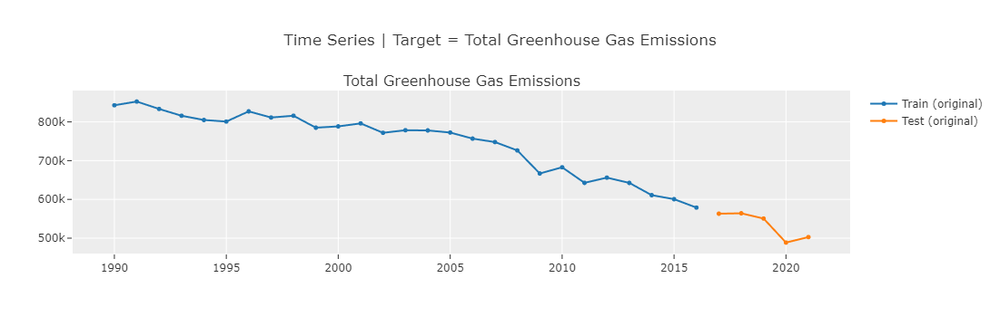

In [136]:
plot_model(plot = 'train_test_split')

In [137]:
# Check best model
best = compare_models()

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ets,ETS,2.0151,1.8485,27826.9403,31230.0799,0.0424,0.0415,-0.3373,0.0133
exp_smooth,Exponential Smoothing,2.0375,1.8630,28154.2315,31497.2481,0.0429,0.0420,-0.3716,0.0167
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,2.1471,1.9657,29683.3742,33670.1492,0.0448,0.0433,-1.3281,0.0767
theta,Theta Forecaster,2.2602,2.1278,30742.5042,35429.3165,0.0463,0.0445,-1.4677,0.0133
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0833
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0800
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0800
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0833
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0300
omp_cds_dt,Orthogonal Matching Pursuit w/ Cond. Deseasonalize & Detrending,2.2612,2.1535,31536.9891,37301.3863,0.0488,0.0466,-0.8919,0.0367


In [138]:
# Predict on train split
predict_model(best, fh=5)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,ETS,0.7621,0.7879,12882.4169,16714.8465,0.0247,0.0245,0.7245


,y_pred
2017,566192.78
2018,550701.36
2019,535209.93
2020,519718.51
2021,504227.08


In [139]:
ghg_total.tail()

,Total Greenhouse Gas Emissions
Year,
2017-01-01,563160.30
2018-01-01,564144.50
2019-01-01,550583.80
2020-01-01,488596.40
2021-01-01,502786.60


#### NUMERIC TESTING FOR ACCURACY OF MODEL ####

In [140]:
ghg_total['Total Greenhouse Gas Emissions'].mean()

714306.346875

In [141]:
# Numeric tests to measure accuracy

actual_values = [563160.30, 564144.50, 550583.80, 488596.40, 502786.60]
predicted_values = [566192.78, 550701.36, 535209.93, 519718.51, 504227.08]

rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
print(f'Root Mean Squared Error (RMSE): {rmse:.2f}')

Root Mean Squared Error (RMSE): 16714.85


In [142]:
# Actual values
actual = np.array([563160.30, 564144.50, 550583.80, 488596.40, 502786.60])

# Predicted values
predicted = np.array([566192.78, 550701.36, 535209.93, 519718.51, 504227.08])

# Calculate absolute percentage error for each year
ape = np.abs(actual - predicted) / np.abs(actual) * 100

# Calculate MAPE
mape = np.mean(ape)

print("Absolute Percentage Errors:", ape)
print("MAPE:", mape)

Absolute Percentage Errors: [0.53847546 2.38292494 2.79228521 6.36969695 0.28649928]
MAPE: 2.47397636817673


#### CREATING FORECAST ####

In [143]:
# finalise the model to create a 5 year forecast
finalise_best_five_years = finalize_model(best)

In [144]:
predict_model(finalise_best_five_years, fh=5)

,y_pred
2022,480145.82
2023,462990.45
2024,445835.07
2025,428679.70
2026,411524.33


In [145]:
# See if UK is on track meeting its 2050 policy goal
finalise_best_2050 = finalize_model(best)
predict_model(finalise_best_2050, fh=29)

,y_pred
2022,480145.82
2023,462990.45
2024,445835.07
2025,428679.70
2026,411524.33
2027,394368.95
2028,377213.58
2029,360058.20
2030,342902.83
2031,325747.45


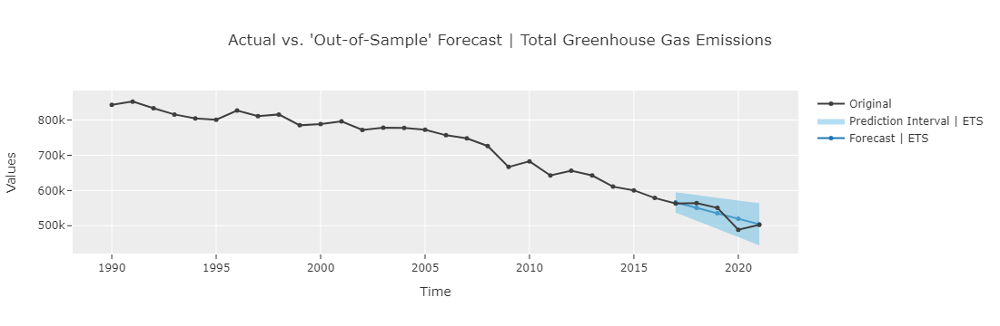

In [146]:
# Visualise how well the model prediction does against actual values
plot_model(best, plot = 'forecast')

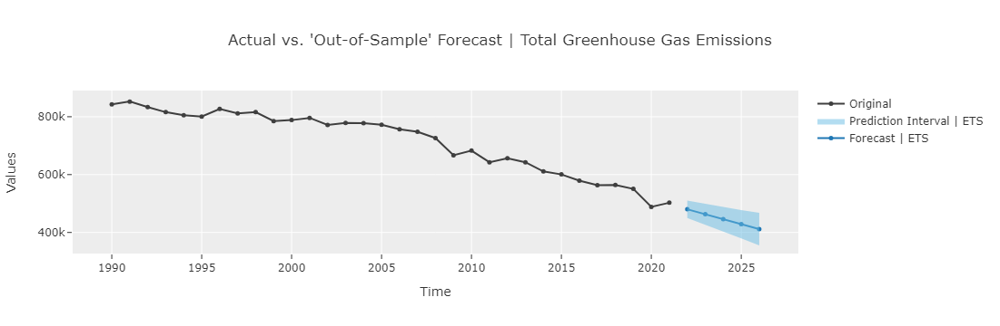

In [147]:
plot_model(finalise_best, plot = 'forecast')

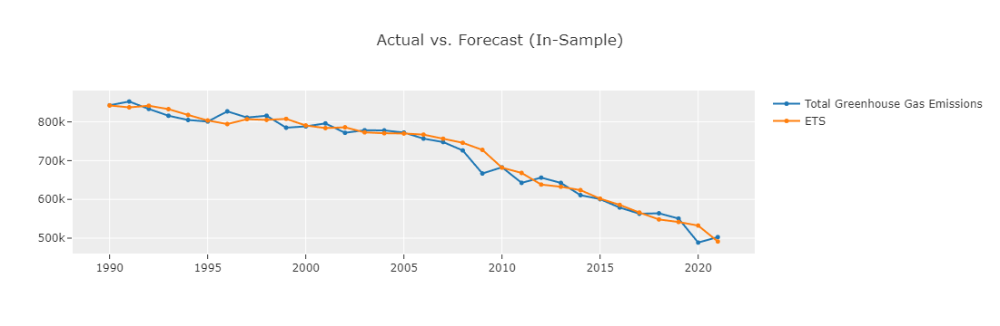

In [148]:
plot_model(finalise_best, plot = 'insample')

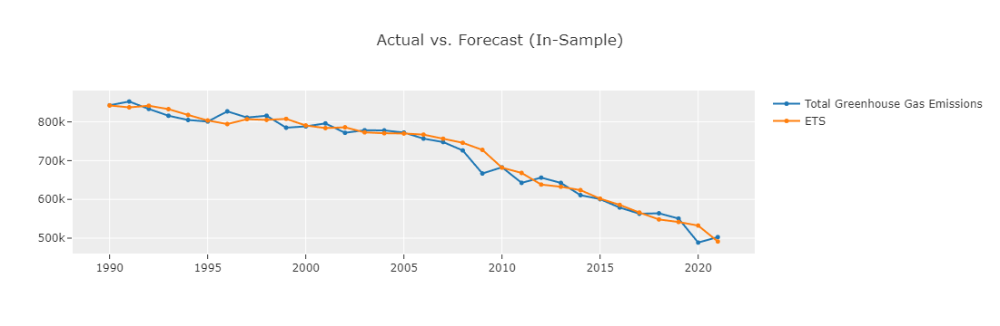

In [149]:
plot_model(finalise_best, plot = 'insample')

### REGRESSION MODEL ###

In [150]:
# Lag taget variable 
ghg_total['target'] = ghg_total.shift(-1)['Total Greenhouse Gas Emissions']
ghg_total

,Total Greenhouse Gas Emissions,target
Year,,
1990-01-01,842944.60,852556.50
1991-01-01,852556.50,833417.10
1992-01-01,833417.10,815888.80
1993-01-01,815888.80,804929.00
1994-01-01,804929.00,800882.10
1995-01-01,800882.10,827193.70
1996-01-01,827193.70,811315.70
1997-01-01,811315.70,815920.60
1998-01-01,815920.60,785099.20


In [151]:
# Delete row ith NaN
ghg_total_without_nan = ghg_total.iloc[:-1].copy()
ghg_total_without_nan

,Total Greenhouse Gas Emissions,target
Year,,
1990-01-01,842944.60,852556.50
1991-01-01,852556.50,833417.10
1992-01-01,833417.10,815888.80
1993-01-01,815888.80,804929.00
1994-01-01,804929.00,800882.10
1995-01-01,800882.10,827193.70
1996-01-01,827193.70,811315.70
1997-01-01,811315.70,815920.60
1998-01-01,815920.60,785099.20


In [152]:
from sklearn.linear_model import Ridge

In [153]:
reg = Ridge(alpha=.1)

In [154]:
# Create target variable
predictors = ['Total Greenhouse Gas Emissions']

In [155]:
# Set train split test
train = ghg_total_without_nan.loc[:'2015-01-01']
test = ghg_total_without_nan.loc['2016-01-01':]

In [156]:
# Fit model
reg.fit(train[predictors], train['target'])

Ridge(alpha=0.1)

In [157]:
predictions = reg.predict(test[predictors])

In [158]:
from sklearn.metrics import mean_absolute_error

In [159]:
mean_absolute_error(test['target'],predictions)

20515.658262780238

In [160]:
# Combine actual and predictions
combined = pd.concat([test['target'], pd.Series(predictions, index=test.index)], axis=1)
combined.columns = ['actual', 'predictions']
combined

,actual,predictions
Year,,
2016-01-01,563160.30,561852.82
2017-01-01,564144.50,545520.19
2018-01-01,550583.80,546542.94
2019-01-01,488596.40,532451.07
2020-01-01,502786.60,468035.63


<AxesSubplot: xlabel='Year'>

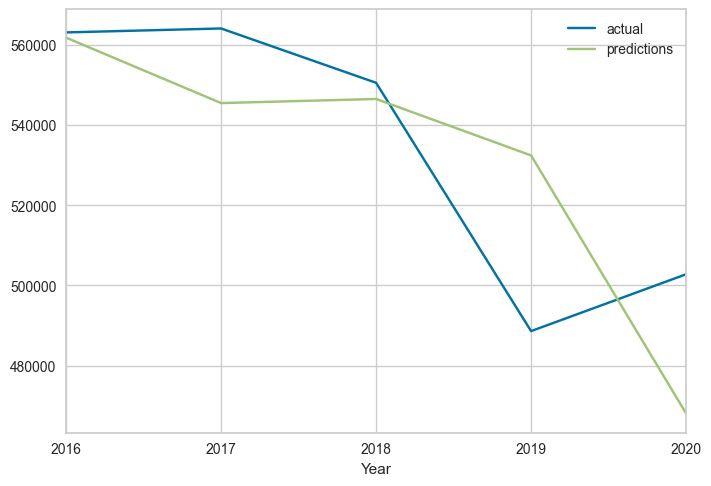

In [161]:
combined.plot()

In [162]:
# Can comapre regression model against PyCaret

# Actual values
actual_values = np.array([563160.30, 564144.50, 550583.80, 488596.40, 502786.60])

# Predicted values
predicted_values = np.array([561852.82, 545520.19, 546542.94, 532451.07, 468035.63])

# Calculate absolute percentage error for each year
ape = np.abs(actual_values - predicted_values) / np.abs(actual_values) * 100

# Calculate MAPE
mape = np.mean(ape)

print("Absolute Percentage Errors:", ape)
print("MAPE:", mape)

Absolute Percentage Errors: [0.23216835 3.3013368  0.73392279 8.97564329 6.91167386]
MAPE: 4.03094902010357
